In [ ]:
# Unzip the uploaded data into the Google Drive
#!unzip 'drive/MyDrive/Dog-visions/dog-breed-identification.zip' -d 'drive/MyDrive/Dog-visions/'

## End-to-end multil-class Dog breed classification

This notebook builds an end-to-end image classifier using
TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
     Identifying the breed of a dog given an image of a dog

     I want to know what beed of a dog i have.
## 2. Data
  The data we're using is from kaggle's dog breed       identification competition.

https//www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
The evaluation is file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview
## 4. Features

Some informations about the data:
* We're dealing with images (unstructured data) so it's a probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images has no labels, because we want to predict them)

## Get our workspace ready

* Import TensorFlow 2.x 
* Import TensorFLow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available (YESSSS!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF version: 2.9.2
TF Hub version: 0.12.0
GPU available (YESSSS!!!)


## Getting our data ready (turning our images into Tensors)

With all machine learning models, our data has to be in numeric format, so that's what we will be doing first, Turning our images into tensors (numerical representation)

Let's start by accessing our data and checking out the labels

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_cv = pd.read_csv('drive/MyDrive/Dog-visions/labels.csv')
print(labels_cv.describe)
print(labels_cv.head())

<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97    

In [ ]:
labels_cv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


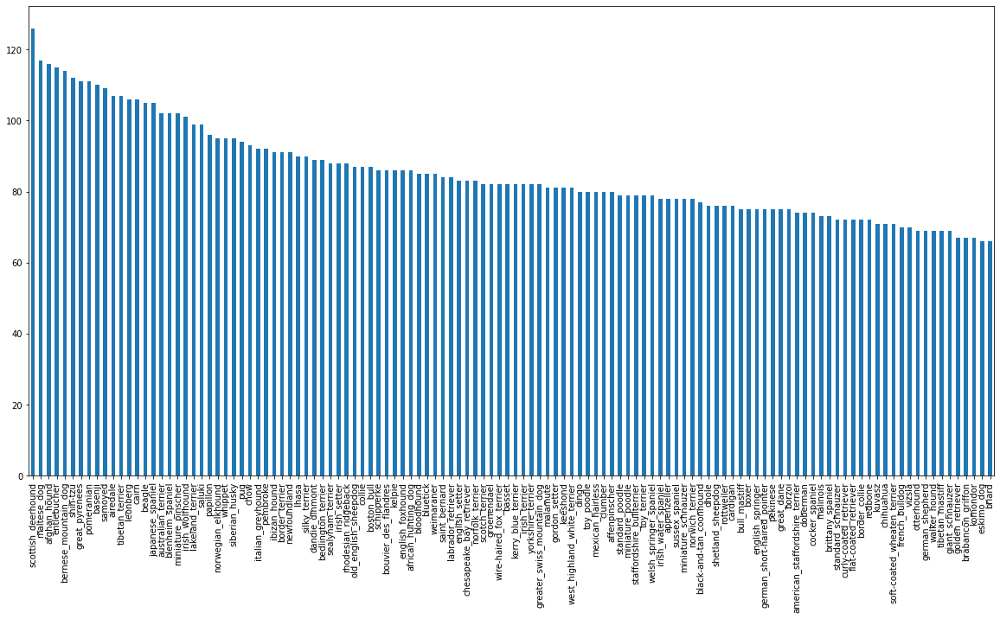

In [ ]:
# How many images are there of each breed?
labels_cv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_cv['breed'].value_counts().mean()

85.18333333333334

In [ ]:
labels_cv['breed'].value_counts().median()

82.0

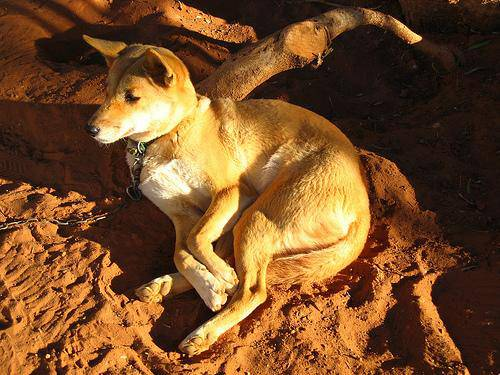

In [ ]:
# Let's view the images
from IPython.display import Image
Image('drive/MyDrive/Dog-visions/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

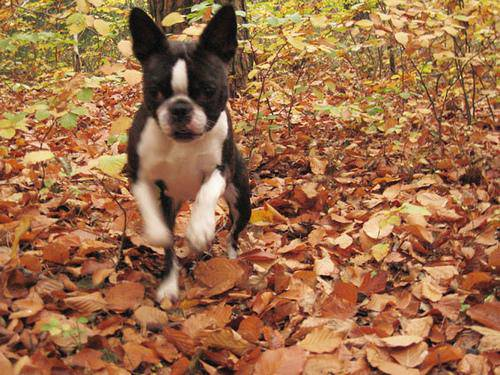

In [ ]:
Image('drive/MyDrive/Dog-visions/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## Getting images and their labels

Let's get a list of our images file pathnames

In [ ]:
labels_cv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathname from image ID's
filename = ['drive/MyDrive/Dog-visions/train/' + fname + '.jpg' for fname in labels_cv['id']]
filename[:10]

['drive/MyDrive/Dog-visions/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-visions/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-visions/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-visions/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-visions/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-visions/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-visions/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-visions/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-visions/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-visions/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir('drive/MyDrive/Dog-visions/train/')[:10]

['e09cf0d6051273932911650565c30e0f.jpg',
 'e236f0b66a5a700022dbed8458e81d26.jpg',
 'e593c0438ce45ae8abc32a8ad154e776.jpg',
 'dfc726ff7000561805073a11d0d64178.jpg',
 'e07277bc6a6a0da06598b3ad43a011b2.jpg',
 'e81e8496a9826236ee5dfb24960aec6d.jpg',
 'e96a5909f47824c1410fd00e3bc23f4d.jpg',
 'e0032d2cfc32a75f448d9f931f6bca19.jpg',
 'e8d09f74216aeede7e77829e177de7c0.jpg',
 'e7f491cb903ff0a294eb63c625ef090e.jpg']

In [ ]:
# Check if the number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog-visions/train/')) == len(filename):
  print('Filename match actual amount of file!!! Proceed.')
else:
  print('Filename do not match actual amount of files, check the target directory.')   

Filename match actual amount of file!!! Proceed.


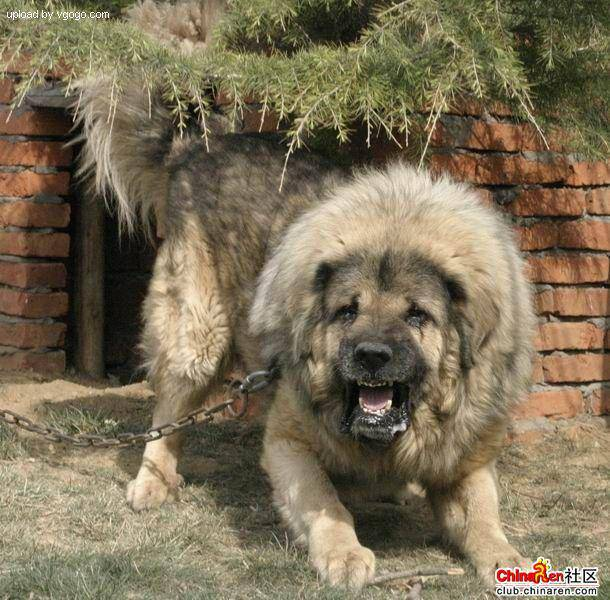

In [ ]:
# One more check
Image(filename[9000])

In [ ]:
labels_cv['breed'][9000]

'tibetan_mastiff'

Since we've got our training image filepath in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_cv['breed'].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if number of label matches the number of filenames
if len(labels) == len(filename):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames, check data directories')  

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example turning boolean arrays into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[3])
print(boolean_labels[3].astype(int)) 

bluetick
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filename[:10]

['drive/MyDrive/Dog-visions/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-visions/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-visions/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-visions/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-visions/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-visions/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-visions/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-visions/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-visions/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-visions/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set

Since kaggle didn't provide validation set for us on the dataset, we're going to create our own.

In [ ]:
# Set up X and Y variables
X = filename
y = boolean_labels

In [ ]:
len(X)

10222

In [ ]:
len(y)

10222

We're going to start off experimenting with ~1000 images and increase as neede.

In [ ]:
# Set number of images for experimentint
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
from pandas.core.common import random_state
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:3]

(['drive/MyDrive/Dog-visions/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-visions/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog-visions/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog-visions/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog-visions/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images(Turning data/images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified 'image'

Let's see what importing an image looks like.

In [ ]:
# Convert image into Numpy array
from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max()

255

In [ ]:
image.min()

0

In [ ]:
# Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

let's make a function now

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Taken an image file path and turns the image into a Tensor.
  ''' 
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values of image from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# Check what the function does
#tf.io.read_file(filename[30])
#tf.image.decode_jpeg(tensor, channels=3)

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000 images in one go... they all might not fit into memory.

So that's why we do about 32(batch size) you can manually adjust the batch sizeif need be

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this: '(image, label)'

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the 
  image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form. lets make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define a batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs,
  Shuffles the data if it's training data but doesn't shuffle if its validation data,
  Also accept test data as input (no labels).
  '''
  # If the data is test dataset, we probaly don't have have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #  filepaths and labels)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print('Creating training data batches...')
    # Turn file paths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch  

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

our data is now in batches, however these can be a little hard to understand/comprehend, let's visualize the data

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Set up the figure
  plt.figure(figsize=(15, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Displays an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i]. argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())


In [ ]:
len(train_images), len(train_labels)

(32, 32)

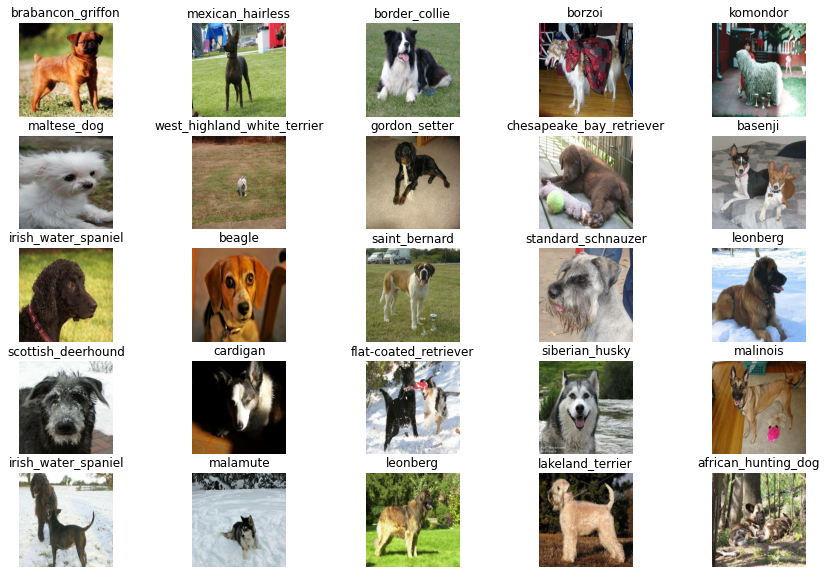

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels) # it shuffles the data batches

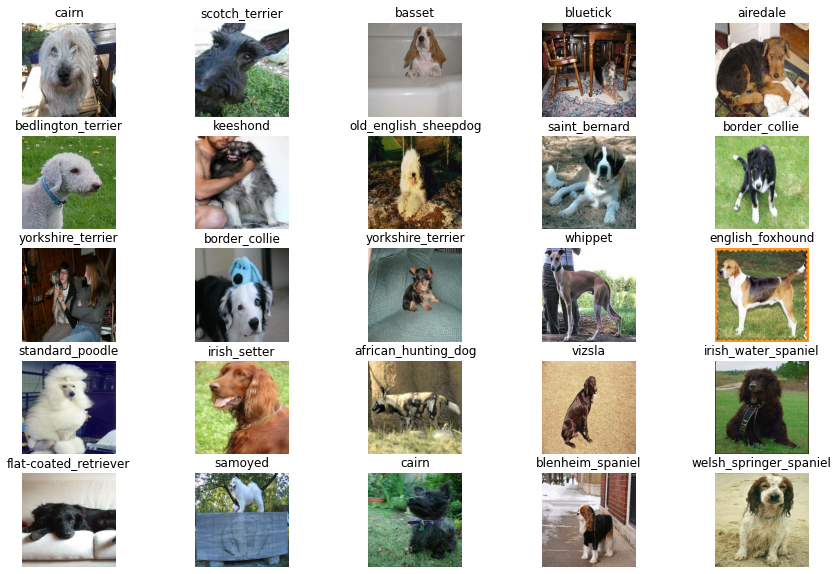

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model 

Before we build a model, there are few things we need to define:
* The input shape (Our image shape, in the form of Tensors) to our model.
* The out shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, weight, colour channels

# set up output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now we've got our inputs, outputs and model ready to go, Lets put them together into keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved)
* Build the model (tells the model the input shape it'll be getting)
* Returns the model.

In [ ]:
from tensorflow._api.v2.config import optimizer
# Create a function which build a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential((
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)
  )) 

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save it progress, check its progress or stop training early if a model stop improving

We'll create two callbacks, one For TensorBoard which help helps track our models progress and another for early stopping which prevent our model for training too long.

### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the tensorboard magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a Tensorboard callbacks
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/MyDrive/Dog-visions/logs',
                        # make it so the logs get tracked whenever we ru an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback

Early Stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Traing a Model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print('GPU', 'available (YESSS!!!)') if tf.config.list_physical_devices('GPU') else 'not available'

GPU available (YESSS!!!)


Let's create a function which trains a model

* Create a model using Create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for(NUM_EPOCHS) and  callbacks we'd like to use

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # create a model
  model = create_model()

  # create new TensorBoard session everytime we trained a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model 
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 461s 18s/step - loss: 4.5976 - accuracy: 0.1000 - val_loss: 3.4737 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 3s 125ms/step - loss: 1.6550 - accuracy: 0.6825 - val_loss: 2.1811 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 157ms/step - loss: 0.5852 - accuracy: 0.9275 - val_loss: 1.6732 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 157ms/step - loss: 0.2587 - accuracy: 0.9900 - val_loss: 1.4699 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 128ms/step - loss: 0.1505 - accuracy: 0.9975 - val_loss: 1.4183 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 157ms/step - loss: 0.1030 - accuracy: 0.9987 - val_loss: 1.3586 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is ovefitting because it performs far better on the training dataset than the validation set, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! it means our model is learning!!

### Checking the TensorBoard logs

The tensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-visions/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 9s 102ms/step


array([[7.7309884e-04, 3.8768670e-05, 4.2744903e-04, ..., 7.1938644e-05,
        1.5927055e-05, 1.4777649e-03],
       [1.1179994e-03, 8.1058126e-04, 7.1358536e-03, ..., 3.3965112e-05,
        5.3415820e-03, 1.0270871e-05],
       [1.4508261e-05, 2.2778730e-05, 2.2057181e-06, ..., 3.3058066e-05,
        5.3915037e-06, 4.2804066e-05],
       ...,
       [1.4185302e-06, 9.0001076e-06, 1.1819754e-06, ..., 4.0483146e-06,
        3.2582288e-05, 2.1925425e-05],
       [2.8748980e-03, 3.8677937e-04, 8.0128601e-05, ..., 1.4235957e-04,
        9.6701566e-05, 7.9710139e-03],
       [1.0916825e-03, 5.9857457e-06, 6.1282929e-04, ..., 7.3114381e-04,
        5.1052653e-04, 2.4071793e-05]], dtype=float32)

In [ ]:
predictions[0]

array([5.75906015e-04, 1.34505157e-04, 1.54196518e-03, 3.62074206e-04,
       4.71630745e-04, 3.29985778e-05, 1.74960829e-02, 3.88242479e-04,
       1.06071551e-04, 2.42336583e-03, 2.19593116e-04, 2.38334571e-04,
       2.54478888e-04, 4.82133873e-05, 8.03670380e-04, 2.79789179e-04,
       1.19845301e-03, 1.08025029e-01, 3.61108177e-05, 1.14985938e-04,
       4.66929399e-04, 3.08838615e-04, 1.88699087e-05, 2.64549395e-03,
       4.70655941e-05, 1.13133428e-04, 3.66152108e-01, 1.55638729e-04,
       5.07957127e-04, 3.59283120e-04, 8.14428611e-04, 4.64656332e-04,
       1.38203060e-04, 2.02372074e-04, 4.53366112e-04, 4.75436747e-02,
       2.16129465e-05, 7.60377210e-04, 1.99606104e-04, 1.16318610e-04,
       3.58499674e-04, 9.62863269e-05, 9.80430923e-05, 1.88766222e-04,
       2.08326164e-05, 3.64852429e-04, 8.62266752e-05, 9.49706300e-05,
       2.86183087e-04, 3.39428734e-05, 3.66881024e-04, 7.07034342e-05,
       2.63900170e-03, 1.10061585e-04, 1.58424227e-05, 5.14539352e-05,
      

In [ ]:
# First predictions
index = 40
print(predictions[index])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')


[5.3217468e-06 6.0605485e-05 1.5946911e-05 2.1560568e-06 1.8418769e-03
 5.1384461e-05 9.7485417e-06 5.8862148e-05 3.8514686e-06 4.0292834e-05
 6.4988481e-06 8.2045717e-06 1.3395436e-03 3.6203216e-06 1.1654350e-04
 7.0368194e-05 1.8669858e-05 1.3438672e-04 5.8114216e-07 1.2260732e-04
 3.8098682e-05 2.3192599e-05 1.6515800e-05 5.0232789e-05 2.0417868e-04
 1.1600209e-03 1.1174361e-05 3.7200829e-05 1.5898594e-03 4.8934908e-06
 2.5217452e-05 1.7006609e-05 3.4296678e-05 4.1328010e-05 1.1022344e-03
 4.0739092e-06 9.8146438e-06 1.2960452e-04 2.8538582e-04 7.5329066e-05
 8.2963896e-05 2.3450013e-05 7.6911709e-04 2.3564130e-04 4.4970880e-03
 4.5861518e-05 2.2310624e-04 7.7914295e-04 1.5161945e-03 5.5290223e-04
 6.5365280e-06 9.0750495e-05 6.8316853e-04 4.3616522e-04 7.1266892e-05
 8.8614315e-06 2.1935969e-06 4.8210668e-06 1.2997387e-04 4.4005021e-05
 8.4471985e-06 1.9810568e-05 2.1340536e-06 1.2895306e-04 6.7566766e-06
 7.9524543e-06 2.2442173e-03 9.4277710e-01 1.7802141e-06 4.7621789e-04
 6.462

Having the above functionality is great but we want to be able to do it at scale,
and it would be even better if we could see image the prediction is being made on!

**Note:** Predictions probabilities are also known as confidence level

In [ ]:
# Turn prediction probabilities into their respespective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label  

'walker_hound'

Since our validation data is stil in batch dataset, we'll have to make predictions on the validation images and then compare these predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  '''
  images = []
  label = []
  #loop through unbatched data
  for image, labels in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    label.append(unique_breeds[np.argmax(labels)])
  return images, label

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]   

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got a way to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize

We'll create a function which:
* Take an array of Prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted labels
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, label, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], label[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'  

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label, np.max(pred_prob)*100, true_label), color=color)

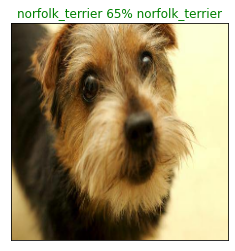

In [ ]:
plot_pred(prediction_probabilities=predictions,
          label=val_labels,
          images=val_images,
          n=88)


Now we've got one function to visualize our models prediction, let's make another to view our models top ten predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()
* Find the top ten:
  * Prediction probabilities indexes
  * prediction probabilities values
  * Prediction labels
* Plot the top ten prediction probabilities valus and labels, coloring the true label green  

In [ ]:
def plot_pred_conf(prediction_probabilities, label, n=1):
    '''
    plus the top ten highest prediction confidence along with the truth label for sample n.
    '''
    pred_prob, true_label = prediction_probabilities[n], label[n]
    
    # Get the predicted label
    pred_label = get_pred_label(pred_prob)
    
    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence value
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]
    
    #setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    plt.xticks(np.arange(len(top_10_pred_labels)),
               label=top_10_pred_labels,
               rotation='vertical')
    
    # Change the color of the true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
    else:
        pass

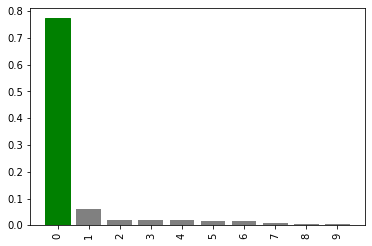

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               label=val_labels,
               n=8)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

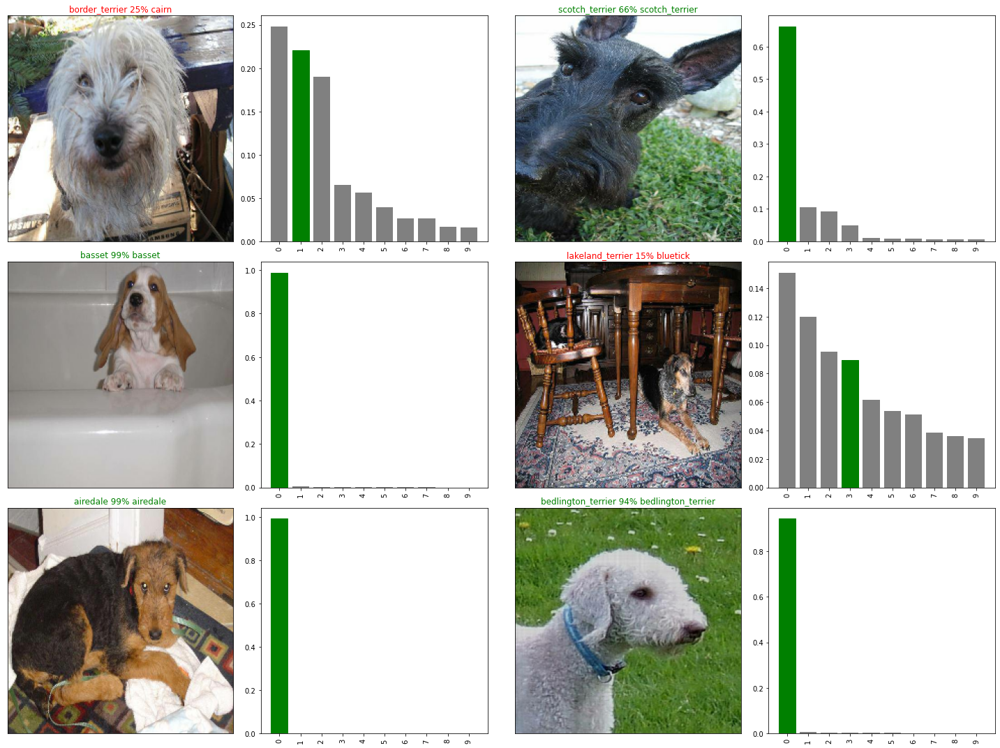

In [ ]:
# let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in  range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              label=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   label=val_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
    '''
    Saves a given model in a models directory and appends a suffix (string).
    '''
    # Create a model directory pathname with current time
    modeldir = os.path.join('drive/MyDrive/Dog-visions/models',
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + '-' + '.h5' # save format of model
    print(f'Saving model to: {model_path}...')
    model.save(model_path)
    return model_path

In [ ]:
# create a function to load a trained model
def load_model(model_path):
    '''
    Loads a save model from a specified path.
    '''
    print(f'Loading a saved model from: {model_path}')
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={'KerasLayer':hub.KerasLayer})
    return model

Now we've got functions to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog-visions/models/20221031-14211667226098-.h5...


'drive/MyDrive/Dog-visions/models/20221031-14211667226098-.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog-visions/models/20221031-14211667226098-.h5')

Loading a saved model from: drive/MyDrive/Dog-visions/models/20221031-14211667226098-.h5


In [ ]:
# evalute the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 116ms/step - loss: 1.2100 - accuracy: 0.6800


[1.2100014686584473, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 149ms/step - loss: 1.2100 - accuracy: 0.6800


[1.2100014686584473, 0.6800000071525574]

## Training a big dog model on the full data

In [ ]:
len(X_train)

800

In [ ]:
# Create a databatch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                       patience=3)

Running the cell below will take time about 30 minutes

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3818s 12s/step - loss: 1.3245 - accuracy: 0.6724
Epoch 2/100
320/320 [==============================] - 35s 108ms/step - loss: 0.4031 - accuracy: 0.8797
Epoch 3/100
320/320 [==============================] - 36s 113ms/step - loss: 0.2340 - accuracy: 0.9381
Epoch 4/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1514 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1065 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0765 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0589 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 37s 114ms/step - loss: 0.0463 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0369 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 37s 116m

In [ ]:
save_model(full_model, suffix='full-set-mobilenetv2-adam')

Saving model to: drive/MyDrive/Dog-visions/models/20221031-15581667231916-.h5...


'drive/MyDrive/Dog-visions/models/20221031-15581667231916-.h5'

In [ ]:
# load the full model
loaded_full_model = load_model('drive/MyDrive/Dog-visions/models/20221031-15581667231916-.h5')

Loading a saved model from: drive/MyDrive/Dog-visions/models/20221031-15581667231916-.h5


## Making predictions on the text dataset

Since our model has been trained on images in the form of Tensor batches, to make a predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches' earlier which can take a list of filename as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test batches using create_data_batches() and setting the test_data parameters to True(since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the predict() method called on the model

In [ ]:
# Load test image filename
test_path = 'drive/MyDrive/Dog-visions/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-visions/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 'drive/MyDrive/Dog-visions/test/e6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 'drive/MyDrive/Dog-visions/test/e330d9cfe81e42338ddbf8a121930e83.jpg',
 'drive/MyDrive/Dog-visions/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Dog-visions/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/Dog-visions/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Dog-visions/test/e291c3955198350ab26495e9290dbe34.jpg',
 'drive/MyDrive/Dog-visions/test/e5942b2259c795541cd9ea68fb106406.jpg',
 'drive/MyDrive/Dog-visions/test/e24877545b682257ca77ae600df1fe37.jpg',
 'drive/MyDrive/Dog-visions/test/e0f2620cb1ebf648b986c8a09dbd3664.jpg']

In [ ]:
# Create test databatch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

## The cell below is going to take long time because calling "predict()" on our full model will take a long time to run

In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 4242s 13s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('drive/MyDrive/Dog-visions/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog-visions/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.19984588e-06, 1.10479226e-08, 1.06749782e-08, ...,
        1.38410464e-10, 7.45794870e-10, 3.53207315e-06],
       [4.01559994e-08, 2.35044029e-09, 3.63311846e-11, ...,
        6.52998489e-11, 1.11004241e-10, 1.63994895e-09],
       [2.82062684e-09, 6.37020384e-13, 3.29143518e-11, ...,
        1.39049106e-09, 2.03078995e-11, 7.14551890e-11],
       ...,
       [1.49569901e-09, 1.01106146e-07, 1.83812521e-08, ...,
        6.94388505e-11, 3.65481654e-08, 6.41756231e-11],
       [4.63373589e-13, 3.96727701e-14, 2.10936026e-11, ...,
        7.63146653e-13, 1.48410052e-11, 3.23410854e-10],
       [2.35593251e-12, 4.14074497e-10, 6.31679930e-13, ...,
        7.95757700e-08, 4.40444014e-13, 2.73722153e-13]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs to be in Dataframe format with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overveiw/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to kaggle

In [ ]:
## Create a pandas DataFrame with empty column
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['drive/MyDrive/Dog-visions/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 'drive/MyDrive/Dog-visions/test/e6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 'drive/MyDrive/Dog-visions/test/e330d9cfe81e42338ddbf8a121930e83.jpg',
 'drive/MyDrive/Dog-visions/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Dog-visions/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/Dog-visions/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Dog-visions/test/e291c3955198350ab26495e9290dbe34.jpg',
 'drive/MyDrive/Dog-visions/test/e5942b2259c795541cd9ea68fb106406.jpg',
 'drive/MyDrive/Dog-visions/test/e24877545b682257ca77ae600df1fe37.jpg',
 'drive/MyDrive/Dog-visions/test/e0f2620cb1ebf648b986c8a09dbd3664.jpg',
 'drive/MyDrive/Dog-visions/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 'drive/MyDrive/Dog-visions/test/ec59bee2b29342acd414a5a1e72b38e0.jpg',
 'drive/MyDrive/Dog-visions/test/ef69016a79094a8bd47f42ccc14ba63a.jpg',
 'drive/MyDrive/Dog-visions/test/f398e8ff747bfbb95f4aa7660608fc4

In [ ]:
# Append test image ID to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e01a1ea716359e2f0062aca591ff9ca4,1.199846e-06,1.104792e-08,1.067498e-08,3.853396e-07,2.506461e-07,6.300862e-09,3.675578e-06,2.431181e-07,2.662361e-09,...,5.035590e-06,4.112723e-07,8.101076e-07,1.030078e-08,1.722443e-08,9.669956e-09,2.415071e-09,1.384105e-10,7.457949e-10,3.532073e-06
1,e6e8ae7dc0e71c6ae868fd3371fde010,4.015600e-08,2.350440e-09,3.633118e-11,1.229362e-12,9.464116e-12,8.801526e-12,1.667300e-13,6.949860e-11,4.240151e-13,...,3.910592e-10,3.031152e-11,2.906147e-12,2.177766e-12,5.952822e-12,5.165113e-14,2.520346e-13,6.529985e-11,1.110042e-10,1.639949e-09
2,e330d9cfe81e42338ddbf8a121930e83,2.820627e-09,6.370204e-13,3.291435e-11,7.244159e-11,1.018516e-06,4.026339e-08,1.157880e-11,1.642462e-11,1.154686e-12,...,8.682136e-11,1.028665e-08,2.092938e-11,5.219553e-11,6.245209e-12,8.308851e-13,4.512893e-11,1.390491e-09,2.030790e-11,7.145519e-11
3,dea5b2d047b3cb7ce13234140c7bf5aa,1.395494e-06,4.272635e-09,8.240549e-06,7.124117e-06,2.854988e-06,6.724746e-06,3.030764e-09,3.827791e-08,2.473425e-07,...,7.422405e-10,1.065594e-07,3.461335e-08,4.495993e-07,6.207670e-06,4.700643e-09,5.087183e-04,4.289215e-03,1.230613e-01,5.122620e-08
4,e021107c3f07749e5f5b389e57e21ded,9.339411e-10,1.187009e-07,5.009044e-06,2.338836e-10,8.551683e-09,7.427790e-07,1.107271e-06,5.283198e-06,2.781688e-10,...,1.212000e-10,9.371219e-08,1.967760e-08,2.768715e-09,4.593586e-08,2.432462e-07,2.540801e-07,2.763501e-10,4.510053e-07,1.462705e-09


In [ ]:
# Save our predictions dataframe to csv for submission to kaggle
preds_df.to_csv('drive/MyDrive/Dog-visions/full_predictions_mobilenetV2.csv', index=False)